In [1]:
%%capture
# install phik (if not installed yet)
import sys

!"{sys.executable}" -m pip install phik

In [2]:
# import standard packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import itertools
import seaborn as sns

import phik

from phik import resources
from phik.binning import bin_data
from phik.report import plot_correlation_matrix

%matplotlib inline

In [3]:
# if one changes something in the phik-package one can automatically reload the package or module
%load_ext autoreload
%autoreload 2

In [6]:
data = pd.read_csv('Cocoa_socioeconomic_imputed_VF1.csv', sep=';')
#column_headers = list(data.columns.values)
#print("The Column Header :", column_headers)

data.columns = ["ALTITUDE",
    "AGE_PRODUCER",
    "FARM_AREA",
    "FARM_INCOME_.",
    "YEAR_EXPERIENCE_CACAO",
    "MONILIA_DAMAGE_.",
    "BROOM_DAMAGE_.",
    "BPR_DAMAGE_.",
    "AREA_CACAO",
    "HYB_AREA_<20_YEARS",
    "AREA_HYB_>20_YEARS",
    "HYB_AGE",
    "CLONE_AREA",
    "CLONE_AREA.3_<YEARS",
    "CLONE_AREA. >3_YEARS.1",
    "CLONE_AGE",
    "CACAO_YIELD",
    "PRUNING_SHEARS",
    "HYBRID_AREA",
    "HYBRID.",
    "GENDER_PRODUCER",
    "PRODUCER_EDUCATIV_LEVEL",
    "ROAD_ACCESS",
    "MAIN_INCOME",
    "INCOME_DIVERSIFICATION",
    "BANK_CREDIT",
    "CACAO_TENURE",
    "CACAO_TECHNOLOGY",
    "PRUNING_FREQUENCY",
    "INORGANIC_FERT",
    "ORGANIC_FERT",
    "HAND_WEEDING",
    "MECHANICAL_WEED_CONTROL",
    "HERBICIDE_APPLICATION",
    "WEED_CONTROL_FREQUENCY",
    "HARVEST_FREQUENCY",
    "FPR_CONTROL_FREQUENCY",
    "WB_CONTROL_FREQUENCY",
    "ELECTRICITY",
    "X.TECHNICAL_ASSISTANCE",
    "ASSOCIATION",
    "TRAINING",
    "MOTOR_PUMP",
    "CHAINSAW",
    "PRUNING_SHEARS_AEREAL",
    "SCYTHE",
    "AQUEDUCT_WATER",
    "LIGHT",
    "GAS"]

#Convertir primeras 25 columans a categóricas
#data.iloc[:, :25] = data.iloc[:, :25].astype("float64")
#data.iloc[:,25: ] = data.iloc[:,25: ].astype("category")

data_types = {"ALTITUDE": "interval",
    "AGE_PRODUCER": "interval",
    "FARM_AREA": "interval",
    "FARM_INCOME_.": "interval",
    "YEAR_EXPERIENCE_CACAO": "interval",
    "MONILIA_DAMAGE_.": "interval",
    "BROOM_DAMAGE_.": "interval",
    "BPR_DAMAGE_.": "interval",
    "AREA_CACAO": "interval",
    "HYB_AREA_<20_YEARS": "interval",
    "AREA_HYB_>20_YEARS": "interval",
    "HYB_AGE": "interval",
    "CLONE_AREA": "interval",
    "CLONE_AREA.3_<YEARS": "interval",
    "CLONE_AREA. >3_YEARS.1": "interval",
    "CLONE_AGE": "interval",
    "CACAO_YIELD": "interval",
    "PRUNING_SHEARS": "interval",
    "HYBRID_AREA": "interval",
    "HYBRID.": "interval",
     "GENDER_PRODUCER": "category",
    "PRODUCER_EDUCATIV_LEVEL": "category",
    "ROAD_ACCESS": "category",
    "MAIN_INCOME": "category",
    "INCOME_DIVERSIFICATION": "category",
    "BANK_CREDIT": "category",
    "CACAO_TENURE": "category",
    "CACAO_TECHNOLOGY": "category",
    "PRUNING_FREQUENCY": "category",
    "INORGANIC_FERT": "category",
    "ORGANIC_FERT": "category",
    "HAND_WEEDING": "category",
    "MECHANICAL_WEED_CONTROL": "category",
    "HERBICIDE_APPLICATION": "category",
    "WEED_CONTROL_FREQUENCY": "category",
    "HARVEST_FREQUENCY": "category",
    "FPR_CONTROL_FREQUENCY": "category",
    "WB_CONTROL_FREQUENCY": "category",
    "ELECTRICITY": "category",
    "X.TECHNICAL_ASSISTANCE": "category",
    "ASSOCIATION": "category",
    "TRAINING": "category",
    "MOTOR_PUMP": "category",
    "CHAINSAW": "category",
    "PRUNING_SHEARS_AEREAL": "category",
    "SCYTHE": "category",
    "AQUEDUCT_WATER": "category",
    "LIGHT": "category",
    "GAS": "category"}


interval_cols = [col for col, v in data_types.items() if v=='interval' and col in data.columns]
interval_cols

['ALTITUDE',
 'AGE_PRODUCER',
 'FARM_AREA',
 'FARM_INCOME_.',
 'YEAR_EXPERIENCE_CACAO',
 'MONILIA_DAMAGE_.',
 'BROOM_DAMAGE_.',
 'BPR_DAMAGE_.',
 'AREA_CACAO',
 'HYB_AREA_<20_YEARS',
 'AREA_HYB_>20_YEARS',
 'HYB_AGE',
 'CLONE_AREA',
 'CLONE_AREA.3_<YEARS',
 'CLONE_AREA. >3_YEARS.1',
 'CLONE_AGE',
 'CACAO_YIELD',
 'PRUNING_SHEARS',
 'HYBRID_AREA',
 'HYBRID.']

In [7]:
# bin the interval variables
data_binned, binning_dict = bin_data(data, cols=interval_cols, retbins=True)

In [8]:
binning_dict

{'ALTITUDE': [(np.float64(236.99999999999764), np.float64(354.29999999999785)),
  (np.float64(354.29999999999785), np.float64(471.5999999999981)),
  (np.float64(471.5999999999981), np.float64(588.8999999999983)),
  (np.float64(588.8999999999983), np.float64(706.1999999999986)),
  (np.float64(706.1999999999986), np.float64(823.4999999999987)),
  (np.float64(823.4999999999987), np.float64(940.7999999999989)),
  (np.float64(940.7999999999989), np.float64(1058.0999999999992)),
  (np.float64(1058.0999999999992), np.float64(1175.3999999999994)),
  (np.float64(1175.3999999999994), np.float64(1292.6999999999998)),
  (np.float64(1292.6999999999998), np.float64(1410.0))],
 'AGE_PRODUCER': [(np.float64(19.9999999999998),
   np.float64(27.89999999999982)),
  (np.float64(27.89999999999982), np.float64(35.79999999999984)),
  (np.float64(35.79999999999984), np.float64(43.69999999999986)),
  (np.float64(43.69999999999986), np.float64(51.59999999999988)),
  (np.float64(51.59999999999988), np.float64(59

In [9]:
# plot each variable pair
plt.rc('text', usetex=False)

n=0
for i in range(len(data.columns)):
    n=n+i

ncols=3
nrows=int(np.ceil(n/ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(15,4*nrows))
ndecimals = 0

for i, comb in enumerate(itertools.combinations(data_binned.columns.values, 2)):

    c = int(i%ncols)
    r = int((i-c)/ncols )

    # get data
    c0, c1 = comb
    datahist = data_binned.groupby([c0,c1])[c0].count().to_frame().unstack().fillna(0)
    datahist.columns = datahist.columns.droplevel()

    # plot data
    img = axes[r][c].pcolormesh(datahist.values, edgecolor='w', linewidth=1)

    # axis ticks and tick labels
    if c0 in binning_dict.keys():
        ylabels = ['{1:.{0}f}_{2:.{0}f}'.format(ndecimals, binning_dict[c0][i][0], binning_dict[c0][i][1])
                   for i in range(len(binning_dict[c0]))]
    else:
        ylabels = datahist.index

    if c1 in binning_dict.keys():
        xlabels = ['{1:.{0}f}_{2:.{0}f}'.format(ndecimals, binning_dict[c1][i][0], binning_dict[c1][i][1])
                    for i in range(len(binning_dict[c1]))]
    else:
        xlabels = datahist.columns

    # axis labels
    axes[r][c].set_yticks(np.arange(len(ylabels)) + 0.5)
    axes[r][c].set_xticks(np.arange(len(xlabels)) + 0.5)
    axes[r][c].set_xticklabels(xlabels, rotation='vertical')
    axes[r][c].set_yticklabels(ylabels, rotation='horizontal')
    axes[r][c].set_xlabel(datahist.columns.name)
    axes[r][c].set_ylabel(datahist.index.name)
    axes[r][c].set_title('data')

plt.tight_layout()

In [10]:
phik_overview = data.phik_matrix(interval_cols=interval_cols)
phik_overview

,ALTITUDE,AGE_PRODUCER,FARM_AREA,FARM_INCOME_.,YEAR_EXPERIENCE_CACAO,MONILIA_DAMAGE_.,BROOM_DAMAGE_.,BPR_DAMAGE_.,AREA_CACAO,HYB_AREA_<20_YEARS,...,X.TECHNICAL_ASSISTANCE,ASSOCIATION,TRAINING,MOTOR_PUMP,CHAINSAW,PRUNING_SHEARS_AEREAL,SCYTHE,AQUEDUCT_WATER,LIGHT,GAS
ALTITUDE,1.000000,0.092199,0.000000,0.202407,0.000000,0.243236,0.302093,0.217597,0.037315,0.095278,...,0.039851,0.000000,0.134886,0.236556,0.000000,0.113503,0.099084,0.158371,0.227574,0.117692
AGE_PRODUCER,0.092199,1.000000,0.000000,0.000000,0.510812,0.054647,0.196268,0.000000,0.195277,0.000000,...,0.100142,0.092175,0.168029,0.087466,0.047270,0.072049,0.147672,0.157940,0.095401,0.161438
FARM_AREA,0.000000,0.000000,1.000000,0.000000,0.000000,0.132033,0.108521,0.000000,0.547906,0.331314,...,0.000000,0.000000,0.031135,0.170750,0.130917,0.000000,0.110630,0.000000,0.000000,0.000000
FARM_INCOME_.,0.202407,0.000000,0.000000,1.000000,0.092676,0.143726,0.000000,0.245757,0.163552,0.206655,...,0.000000,0.000000,0.081245,0.211649,0.000000,0.068076,0.077105,0.000000,0.000000,0.051789
YEAR_EXPERIENCE_CACAO,0.000000,0.510812,0.000000,0.092676,1.000000,0.202230,0.321668,0.000000,0.171220,0.000000,...,0.099222,0.000000,0.000000,0.126858,0.148135,0.113106,0.142484,0.111276,0.053135,0.080805
MONILIA_DAMAGE_.,0.243236,0.054647,0.132033,0.143726,0.202230,1.000000,0.622186,0.246291,0.260114,0.097554,...,0.141919,0.060848,0.024589,0.000000,0.000000,0.185405,0.154933,0.097985,0.082695,0.180775
BROOM_DAMAGE_.,0.302093,0.196268,0.108521,0.000000,0.321668,0.622186,1.000000,0.297093,0.311448,0.267016,...,0.178055,0.085197,0.000000,0.049987,0.048425,0.063634,0.000000,0.168118,0.116481,0.285193
BPR_DAMAGE_.,0.217597,0.000000,0.000000,0.245757,0.000000,0.246291,0.297093,1.000000,0.080219,0.000000,...,0.000000,0.086752,0.088507,0.170813,0.000000,0.118284,0.000000,0.128992,0.000000,0.000000
AREA_CACAO,0.037315,0.195277,0.547906,0.163552,0.171220,0.260114,0.311448,0.080219,1.000000,0.828990,...,0.000000,0.109067,0.000000,0.000000,0.175287,0.040597,0.000000,0.087305,0.052064,0.000000
HYB_AREA_<20_YEARS,0.095278,0.000000,0.331314,0.206655,0.000000,0.097554,0.267016,0.000000,0.828990,1.000000,...,0.039121,0.063336,0.000000,0.000000,0.000000,0.000000,0.055550,0.000000,0.000000,0.000000


In [11]:
phik_matrix = data.phik_matrix()

phik_matrix.to_csv('matriz_phik_cacao.csv')
print("Ok")



interval columns not set, guessing: ['ALTITUDE', 'AGE_PRODUCER', 'FARM_AREA', 'FARM_INCOME_.', 'YEAR_EXPERIENCE_CACAO', 'MONILIA_DAMAGE_.', 'BROOM_DAMAGE_.', 'BPR_DAMAGE_.', 'AREA_CACAO', 'HYB_AREA_<20_YEARS', 'AREA_HYB_>20_YEARS', 'HYB_AGE', 'CLONE_AREA', 'CLONE_AREA.3_<YEARS', 'CLONE_AREA. >3_YEARS.1', 'CLONE_AGE', 'CACAO_YIELD', 'PRUNING_SHEARS', 'HYBRID_AREA', 'HYBRID.']
Ok


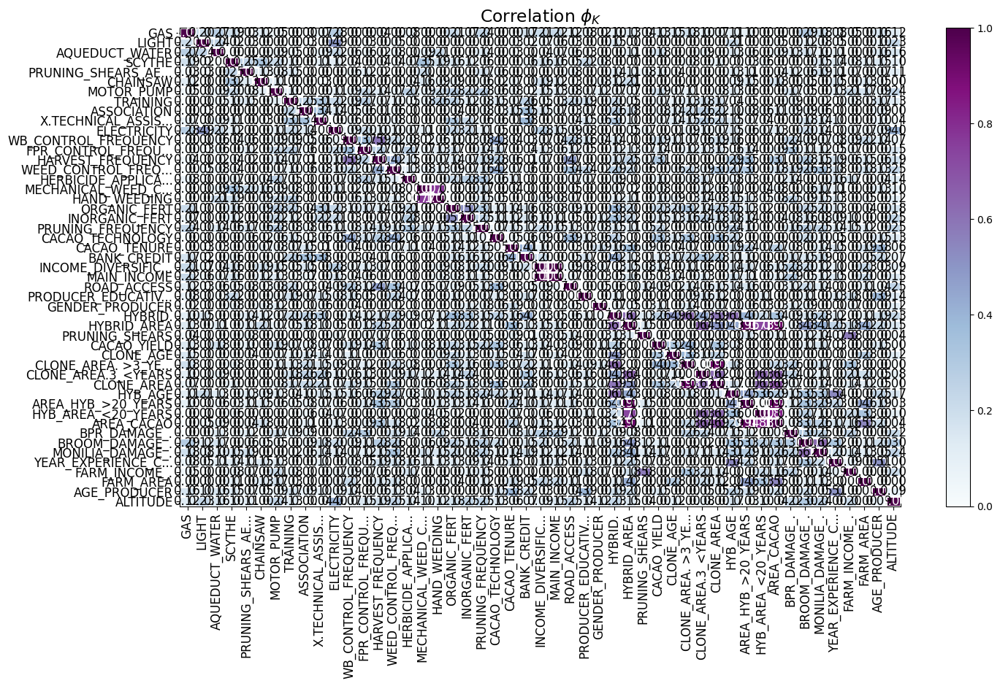

In [12]:
import matplotlib.pyplot as plt

plot_correlation_matrix(phik_overview.values, x_labels=phik_overview.columns, y_labels=phik_overview.index,
                        vmin=0, vmax=1, color_map='BuPu', title=r'Correlation $\phi_K$', fontsize_factor=1.2,
                        figsize=(15,9.5))
plt.tight_layout()

# Specify the file name and format (e.g., PNG, PDF, SVG)
output_file = 'correlation_matrix.png'

# Save the figure with 600 DPI
plt.savefig(output_file, dpi=600)

# Show the plot (optional)
plt.show()

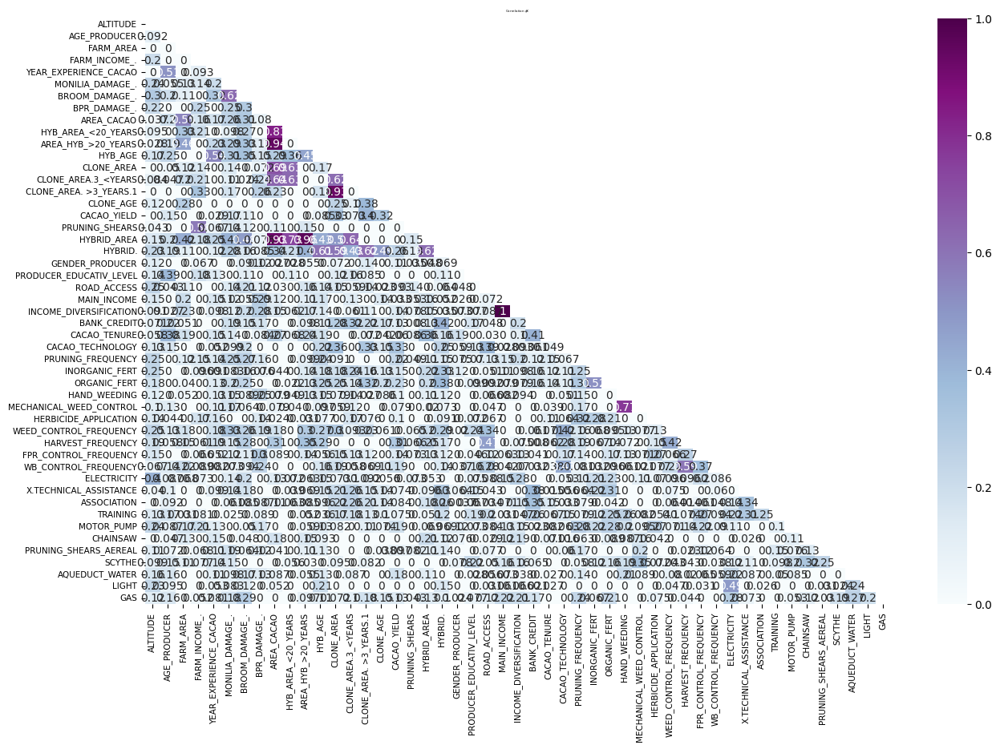

In [13]:
def plot_correlation_matrix(data, x_labels, y_labels, vmin, vmax, color_map, title, fontsize_factor, figsize):
    mask = np.triu(np.ones_like(data, dtype=bool))

    plt.figure(figsize=figsize)
    sns.heatmap(data, mask=mask, vmin=vmin, vmax=vmax, cmap=color_map, annot=True, xticklabels=x_labels, yticklabels=y_labels)

    plt.title(title, fontsize=fontsize_factor*2)
    plt.xticks(fontsize=fontsize_factor*5)
    plt.yticks(fontsize=fontsize_factor*5)

    plt.show()

# Usage
plot_correlation_matrix(phik_overview.values, x_labels=phik_overview.columns, y_labels=phik_overview.index,
                        vmin=0, vmax=1, color_map='BuPu', title=r'Correlation $\phi_K$', fontsize_factor=1.5,
                        figsize=(15, 9.5))


In [14]:
global_correlation, global_labels = data.global_phik(interval_cols=interval_cols)
for c, l in zip(global_correlation, global_labels):
    print(l, c[0])

ALTITUDE 0.7342952844661256
AGE_PRODUCER 0.9077879535977088
FARM_AREA 0.7961783658336691
FARM_INCOME_. 0.8191848507338092
YEAR_EXPERIENCE_CACAO 0.7759722452172667
MONILIA_DAMAGE_. 0.8657505731039623
BROOM_DAMAGE_. 0.6932720243269798
BPR_DAMAGE_. 0.4521008842964169
AREA_CACAO 0.8769217593326136
HYB_AREA_<20_YEARS 1.0
AREA_HYB_>20_YEARS 0.38778575709896473
HYB_AGE 0.6327860829897902
CLONE_AREA 1.0
CLONE_AREA.3_<YEARS nan
CLONE_AREA. >3_YEARS.1 nan
CLONE_AGE 0.7065615939118685
CACAO_YIELD 0.8403610508617895
PRUNING_SHEARS 0.814086616364006
HYBRID_AREA 0.9167070456131226
HYBRID. 0.8220189833367006
GENDER_PRODUCER 0.5994526430002849
PRODUCER_EDUCATIV_LEVEL 0.7047974836352255
ROAD_ACCESS 0.7830543508599552
MAIN_INCOME 1.0
INCOME_DIVERSIFICATION 1.0
BANK_CREDIT 0.7451284851901537
CACAO_TENURE 0.7531092557356814
CACAO_TECHNOLOGY 0.7868460388160273
PRUNING_FREQUENCY 0.6132119103597709
INORGANIC_FERT 0.8103002620205441
ORGANIC_FERT 0.830565638701227
HAND_WEEDING 0.9269130350111289
MECHANICAL_WEE

/Users/paula/.pyenv/versions/3.13.5/lib/python3.13/site-packages/phik/phik.py:319: RuntimeWarning: invalid value encountered in sqrt
  global_correlations = np.sqrt(


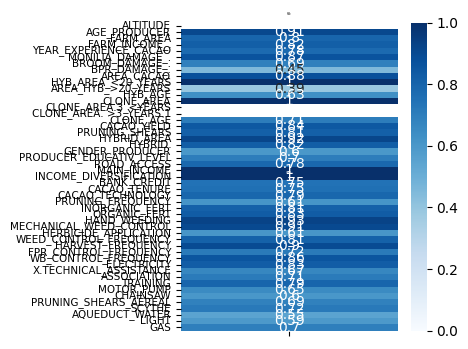

<Figure size 640x480 with 0 Axes>

In [15]:
plot_correlation_matrix(global_correlation, x_labels=[''], y_labels=global_labels,
                        vmin=0, vmax=1, figsize=(3.5,4),
                        color_map='Blues', title=r'$g_k$',
                        fontsize_factor=1.5)
plt.tight_layout()

In [16]:
significance_overview = data.significance_matrix(interval_cols=interval_cols)

significance_overview.to_csv('significance_phik_cacao.csv')
print("Ok")

Ok


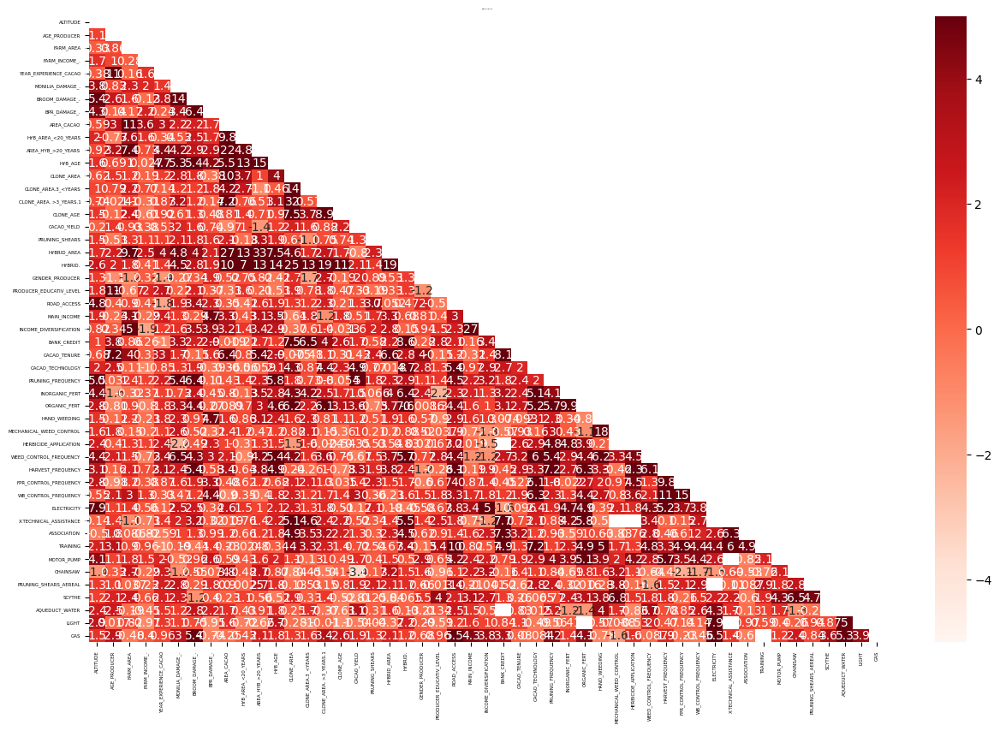

<Figure size 640x480 with 0 Axes>

In [17]:
plot_correlation_matrix(significance_overview.fillna(0).values, x_labels=significance_overview.columns,
                        y_labels=significance_overview.index, vmin=-5, vmax=5, title='significance',
                        color_map='Reds', fontsize_factor=0.8, figsize=(15,9.5))
plt.tight_layout()

In [21]:
mphiK = pd.read_csv('matriz_phik_cacao.csv', sep=',')     
signphiK = pd.read_csv('significance_phik_cacao.csv', sep=',')

# ensure numeric
mphiK = mphiK.apply(pd.to_numeric, errors='coerce')
signphiK = signphiK.apply(pd.to_numeric, errors='coerce')

#print(mphiK.head())
print(signphiK.head())


   Unnamed: 0   ALTITUDE  AGE_PRODUCER  FARM_AREA  FARM_INCOME_.  \
0         NaN  58.501842      1.101755   0.326437       1.704067   
1         NaN   1.101755     56.706695   0.858932       1.010569   
2         NaN   0.326437      0.858932  37.903846       0.283456   
3         NaN   1.704067      1.010569   0.283456      35.921892   
4         NaN   0.377433     11.057739   0.162984       1.581986   

   YEAR_EXPERIENCE_CACAO  MONILIA_DAMAGE_.  BROOM_DAMAGE_.  BPR_DAMAGE_.  \
0               0.377433          3.823655        5.371026      4.270485   
1              11.057739          0.830918        2.587299      0.136368   
2               0.162984          2.301075        1.574667      0.168513   
3               1.581986          1.986974       -0.133042      2.184071   
4              55.842239          1.409942        2.840046      0.237903   

   AREA_CACAO  ...  X.TECHNICAL_ASSISTANCE  ASSOCIATION  TRAINING  MOTOR_PUMP  \
0    0.588111  ...                0.140781    -0.4974

In [22]:
dfPhiK = pd.DataFrame(
    np.where(
        (mphiK > 0.7),
        "Yes",
        "No"
    ),
    index=mphiK.index,
    columns=mphiK.columns
)

print(dfPhiK.head())

  Unnamed: 0 ALTITUDE AGE_PRODUCER FARM_AREA FARM_INCOME_.  \
0         No      Yes           No        No            No   
1         No       No          Yes        No            No   
2         No       No           No       Yes            No   
3         No       No           No        No           Yes   
4         No       No           No        No            No   

  YEAR_EXPERIENCE_CACAO MONILIA_DAMAGE_. BROOM_DAMAGE_. BPR_DAMAGE_.  \
0                    No               No             No           No   
1                    No               No             No           No   
2                    No               No             No           No   
3                    No               No             No           No   
4                   Yes               No             No           No   

  AREA_CACAO  ... X.TECHNICAL_ASSISTANCE ASSOCIATION TRAINING MOTOR_PUMP  \
0         No  ...                     No          No       No         No   
1         No  ...                     No  

In [23]:
dfSignPhiK = pd.DataFrame(
    np.where(
        (signphiK >= 1.96) | (signphiK <= -1.96),
        "Yes",
        "No"
    ),
    index=signphiK.index,
    columns=signphiK.columns
)

print(dfSignPhiK.head())

  Unnamed: 0 ALTITUDE AGE_PRODUCER FARM_AREA FARM_INCOME_.  \
0         No      Yes           No        No            No   
1         No       No          Yes        No            No   
2         No       No           No       Yes            No   
3         No       No           No        No           Yes   
4         No       No          Yes        No            No   

  YEAR_EXPERIENCE_CACAO MONILIA_DAMAGE_. BROOM_DAMAGE_. BPR_DAMAGE_.  \
0                    No              Yes            Yes          Yes   
1                   Yes               No            Yes           No   
2                    No              Yes             No           No   
3                    No              Yes             No          Yes   
4                   Yes               No            Yes           No   

  AREA_CACAO  ... X.TECHNICAL_ASSISTANCE ASSOCIATION TRAINING MOTOR_PUMP  \
0         No  ...                     No          No      Yes        Yes   
1        Yes  ...                     No  

In [24]:
df = pd.DataFrame(
    np.where(
        (mphiK > 0.7) & (signphiK >= 1.96) | (signphiK <= -1.96),
        "Yes",
        "No"
    ),
    index=mphiK.index,
    columns=mphiK.columns
)

print(df.head())

df.to_csv('selected_variables_phik_cacao.csv', index=False)

  Unnamed: 0 ALTITUDE AGE_PRODUCER FARM_AREA FARM_INCOME_.  \
0         No      Yes           No        No            No   
1         No       No          Yes        No            No   
2         No       No           No       Yes            No   
3         No       No           No        No           Yes   
4         No       No           No        No            No   

  YEAR_EXPERIENCE_CACAO MONILIA_DAMAGE_. BROOM_DAMAGE_. BPR_DAMAGE_.  \
0                    No               No             No           No   
1                    No               No             No           No   
2                    No               No             No           No   
3                    No               No             No           No   
4                   Yes               No             No           No   

  AREA_CACAO  ... X.TECHNICAL_ASSISTANCE ASSOCIATION TRAINING MOTOR_PUMP  \
0         No  ...                     No          No       No         No   
1         No  ...                     No  